# DOG VS CAT Image Classification

![my.img](https://storage.googleapis.com/kaggle-media/competitions/kaggle/3362/media/woof_meow.jpg)

# Downloading Dataset

In [1]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-11-03 15:06:05--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 184.27.221.113, 2600:1407:e800:f80::317f, 2600:1407:e800:f8c::317f
Connecting to download.microsoft.com (download.microsoft.com)|184.27.221.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  82.1MB/s    in 12s     

2023-11-03 15:06:18 (65.0 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



## Unzip the Dataset

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

## Importing Modules

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output

In [4]:
input_path = []
label = []

for class_name in os.listdir('PetImages'):
  for path in os.listdir('PetImages/'+class_name):
    if class_name == 'Cat':
      label.append("0")
    else:
      label.append("1")
    input_path.append(os.path.join("PetImages",class_name,path))
print(input_path[0],label[0])

PetImages/Dog/11921.jpg 1


In [5]:
df = pd.DataFrame()
df['input_path'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,input_path,label
0,PetImages/Cat/7969.jpg,0
1,PetImages/Cat/5477.jpg,0
2,PetImages/Cat/8034.jpg,0
3,PetImages/Dog/7747.jpg,1
4,PetImages/Dog/11199.jpg,1


In [6]:
for i in df['input_path']:
  if '.jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [7]:
import PIL
fail = []
for i in df['input_path']:
  try:
    img = PIL.Image.open(i)
  except:
    fail.append(i)
fail

['PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/Thumbs.db',
 'PetImages/Dog/11702.jpg']

In [8]:
## Deleting db files

df = df[df['input_path']!='PetImages/Dog/Thumbs.db']
df = df[df['input_path']!='PetImages/Cat/Thumbs.db']
df = df[df['input_path']!='PetImages/Cat/666.jpg']
df = df[df['input_path']!='PetImages/Dog/11702.jpg']
len(df)

24998

## Exploratory Data Analysis

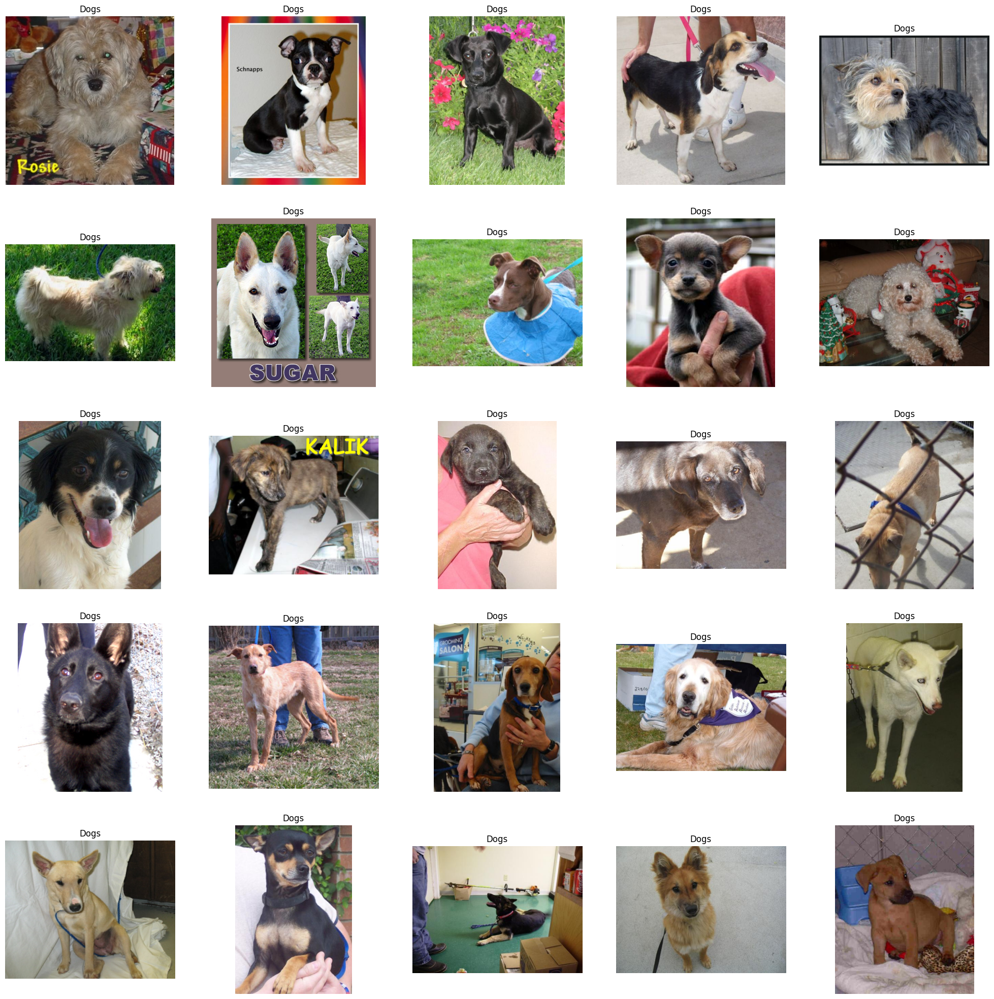

In [9]:
## To display Dogs
plt.figure(figsize=(25,25))
temp = df[df['label'] == "1" ]['input_path']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

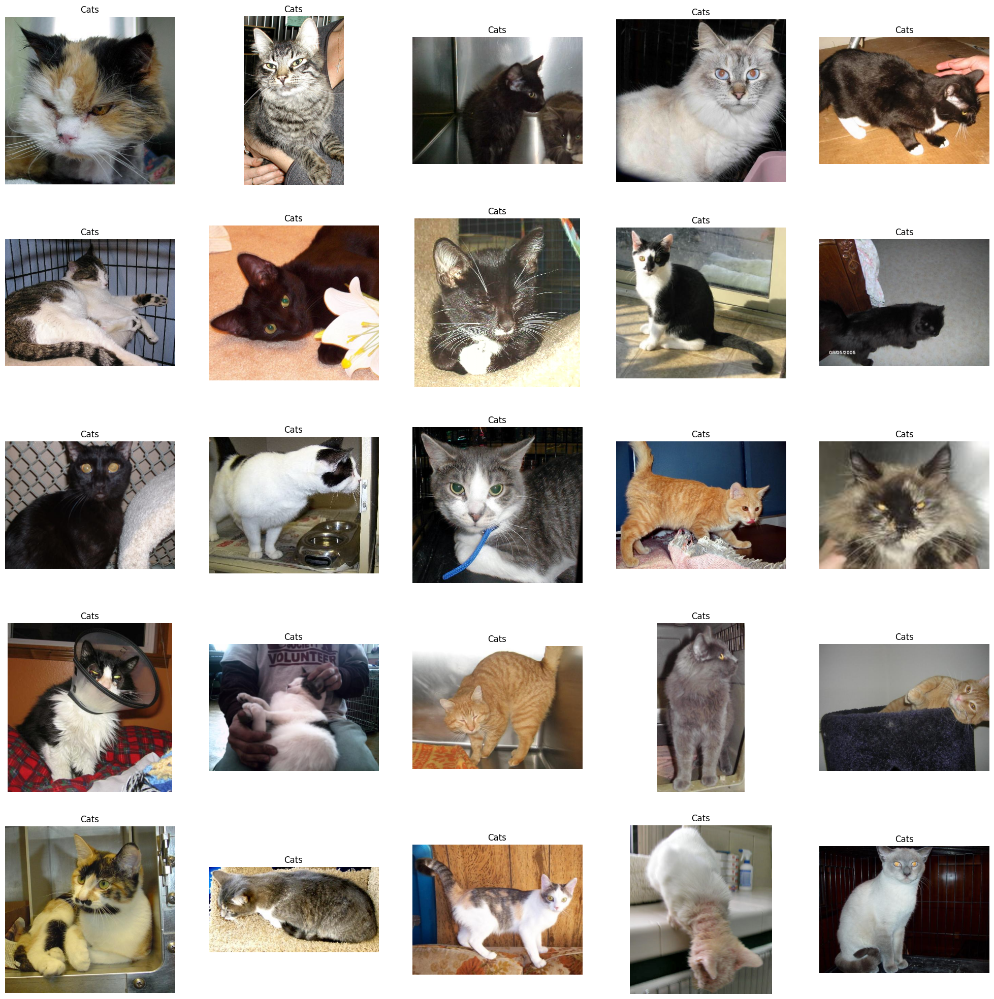

In [10]:
## To Display Cats
plt.figure(figsize=(25,25))
temp = df[df['label'] == "0" ]['input_path']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

<Axes: xlabel='label', ylabel='count'>

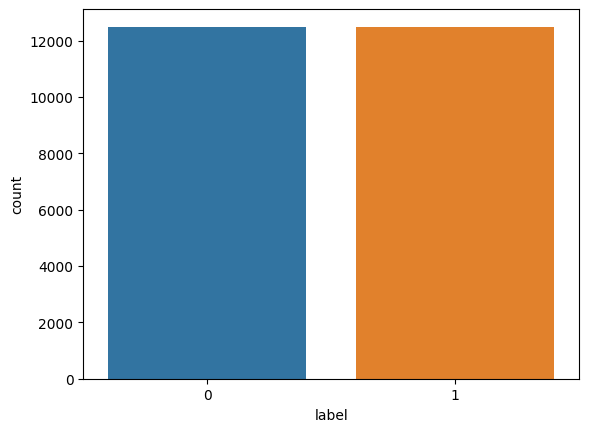

In [11]:
sns.countplot(df,x='label')

## Create DataGenerator for the Images

In [12]:
## Train Test Split

from sklearn.model_selection import train_test_split
train,test = train_test_split(df,test_size=0.2,random_state=42)

In [13]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255, # Normalization of images
    rotation_range= 40, # Agumentaion of images
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip= True,
    fill_mode='nearest'
)

validation_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='input_path',
    y_col='label',
    target_size =(128,128),
    batch_size=512,
    class_mode = 'binary'
)

validation_iterator = validation_generator.flow_from_dataframe(
    test,
    x_col='input_path',
    y_col='label',
    target_size =(128,128),
    batch_size=512,
    class_mode = 'binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [14]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.applications.inception_v3 import InceptionV3, preprocess_input

base_model = InceptionV3(weights='imagenet', include_top =False,input_shape=(128,128,3))


87910968/87910968 [==============================] - 0s 0us/step


In [15]:
for layer in base_model.layers:
  layer.trainable =False

In [16]:
## Creating a new Model
model = Sequential()

## Adding Base model
model.add(base_model)

model.add(Flatten())
model.add(Dense(256,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1,activation='sigmoid'))

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2, 2, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 256)               2097408   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 257       
                                                                 
Total params: 23900449 (91.17 MB)
Trainable params: 2097665 (8.00 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [18]:
## compile the model

model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [19]:
history = model.fit(train_iterator, epochs=10, validation_data = validation_iterator, batch_size=128)

Epoch 1/10
40/40 [==============================] - 142s 3s/step - loss: 1.2677 - accuracy: 0.8002 - val_loss: 0.1665 - val_accuracy: 0.9304
Epoch 2/10
40/40 [==============================] - 118s 3s/step - loss: 0.2622 - accuracy: 0.8857 - val_loss: 0.1499 - val_accuracy: 0.9400
Epoch 3/10
40/40 [==============================] - 117s 3s/step - loss: 0.2485 - accuracy: 0.8951 - val_loss: 0.1427 - val_accuracy: 0.9412
Epoch 4/10
40/40 [==============================] - 118s 3s/step - loss: 0.2351 - accuracy: 0.9022 - val_loss: 0.1354 - val_accuracy: 0.9430
Epoch 5/10
40/40 [==============================] - 120s 3s/step - loss: 0.2260 - accuracy: 0.9040 - val_loss: 0.1324 - val_accuracy: 0.9462
Epoch 6/10
40/40 [==============================] - 119s 3s/step - loss: 0.2192 - accuracy: 0.9076 - val_loss: 0.1315 - val_accuracy: 0.9470
Epoch 7/10
40/40 [==============================] - 120s 3s/step - loss: 0.2221 - accuracy: 0.9046 - val_loss: 0.1259 - val_accuracy: 0.9488
Epoch 8/10
40

In [20]:
## Saving the model
model.save('dog_and_cat_classifier.h5')

<Figure size 640x480 with 0 Axes>

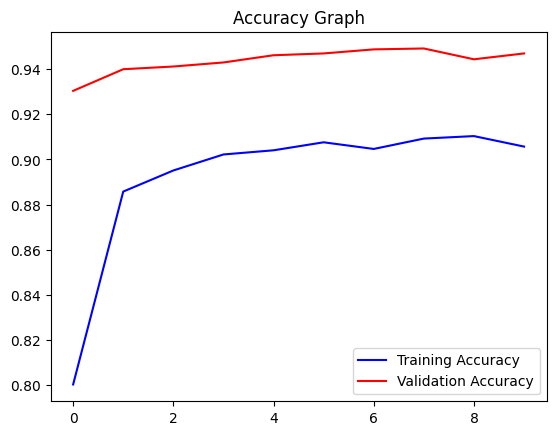

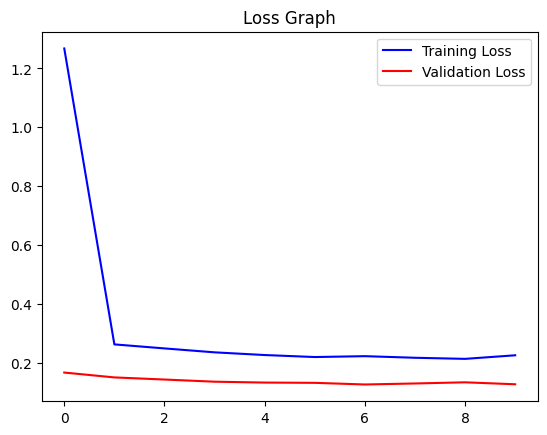

<Figure size 640x480 with 0 Axes>

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs,acc,'b',label='Training Accuracy')
plt.plot(epochs,val_acc,'r',label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs,loss,'b',label='Training Loss')
plt.plot(epochs,val_loss,'r',label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.figure()

In [26]:
## Testing the model

from keras.models import load_model
from keras.preprocessing import image

model_test = load_model('/content/dog_and_cat_classifier.h5')
img_path = "/content/PetImages/Cat/10015.jpg"
test_image = image.load_img(img_path,target_size=(128,128))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image,axis=0)
result = np.argmax(model_test.predict(test_image),axis=1)
if result ==0:
  print('Cat')
else:
  print('Dog')

1/1 [==============================] - 1s 1s/step
Cat
